Deep Learning Lab 08 - Recurrent Neural Networks
# Making Music with LSTMs

Welcome to the DL Lab 08! We will explore today how to build a Recurrent Neural Network (RNN) for generating music. In detail, we will train a LSTM model to learn patterns from midi music files and then use this model to generate new music.

Let's tart!

**Note**: Training DNNs is a computationally expensive process. Most of the computations can be parallelized very efficently, making them a perfect fit for GPU- or TPU-acceleration. In order to enable a GPU for your Colab session, do the following steps:
- Click `Runtime` -> `Change runtime type`
- In the pop-up window, select `GPU` for `Hardware accelerator`
- Click `Save`

# 0 - Test for GPU

<font color='red'>
**Note**: CUDA was recently updated to version 10.1 at Google Colab. The current stable version of TensorFlow 2 (TF2) does not support CUDA 10.1. We have to use the nightly preview of TF2. Run

`!pip install tf-nightly-gpu`

and execute the code below for printing the TF version and testing for GPU availability.
</font>

In [1]:
#@title Install TF2 (nightly) and test GPU
!pip install tf-nightly-gpu

import tensorflow as tf
print('\n\nTensorFlow version:', tf.__version__)

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
   raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

!nvidia-smi



TensorFlow version: 2.1.0-dev20191218
Found GPU at: /device:GPU:0
Thu Dec 19 08:56:04 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    32W / 250W |    265MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:        

# 1 - Background Information

We will use a Long Short Term Memory (LSTM) network, a type of Recurrent Neural Network (RNN) that can be efficiently trained via gradient descent. [Hochreiter and Schmidhuber](http://www.bioinf.jku.at/publications/older/2604.pdf) proposed them for learning long-term dependencies and mitigating vanishing gradients by introduction of a gating mechanism controlling a LSTM cell's state. Hence, LSTMs are very useful to solve problem where a network has to remember information for a long period of time, e.g., music generation.

For processing MIDI files, we will use [Music21](http://web.mit.edu/music21/), a Python "toolkit for computer-aided musicology". It provides a simple interface for translating between MIDI files and musical note and chord notation.

# 2 - Data Preparation

Execute the cell below for downloading a set of free MIDI files we collected from the web. The path of each file will be stored in the list `filepaths`.

In [2]:
#@title Download MIDI files

import requests, os, zipfile
import numpy as np

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"
    session = requests.Session()
    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)
    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)
    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value
    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768
    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

def unzip(file, destination=None):
  if not destination or not os.path.isdir(destination):
    destination = os.path.dirname(file)
  print('unzipping to ',destination)
  zip_ref = zipfile.ZipFile(file, 'r')
  zip_ref.extractall(destination)
  zip_ref.close()


data_path = '/tmp/midi'
!rm -rf $data_path
os.makedirs(data_path)

# download & unzip midi files
download_file_from_google_drive('1QxojOGgQ-1TMsxjfNUMZBayEnhDHciaC', '/tmp/midi.zip')
unzip('/tmp/midi.zip', data_path)

# list of files
filepaths = os.listdir(data_path) 
filepaths = [os.path.join(data_path, x) for x in filepaths if x.endswith('.mid') and not x.startswith('.')]
print('Found {} files'.format(len(filepaths)))

unzipping to  /tmp/midi
Found 13 files


As already stated, we are using Music21 to read and translate the MIDI. As you can see below, the data in the MIDI is mainly split into music *notes* and *chords*:
```
<music21.tempo.MetronomeMark Quarter=77.0>
<music21.note.Note E>
<music21.note.Note B>
<music21.note.Note F#>
<music21.note.Note B>
<music21.chord.Chord F#5 A5>
<music21.note.Note F#>
<music21.tempo.MetronomeMark andantino Quarter=79.0>
<music21.note.Note A>
<music21.note.Note B>
<music21.note.Note A>
<music21.chord.Chord F#3 B2 A5>
```
Every *note* contains information about its pitch, octave, and time offset. We will convert a *note* to a string representing the note name and it's octave:
`<music21.note.Note E>` $\rightarrow$ `'E2'`

*Chords* are a set of *notes* played at the same time. We will store them as a string of numbers separated by dots, and each number represents the pitch of a chord note:
`<music21.chord.Chord F#3 B2 A5>` $\rightarrow$ `'6.9.11'`

The function `get_notes()` is doing this conversion and creates a concatenated list `notes` of *notes* and *chord* strings present in all MIDI files.

In [0]:
#@title `get_notes` definition
from music21 import converter, instrument, note, chord, stream
import pickle
import numpy as np

def get_notes(filepaths, data_out_path=None):
  '''Get all the notes and chords from the midi files in `filepaths`.'''
  
  if data_out_path:
    if os.path.isfile(data_out_path):
      notes = pickle.load( open( data_out_path, 'rb' ) )
      print('Notes read from "{}"'.format(data_out_path))
      return notes
  
  notes = list()

  for idx, file in enumerate(filepaths):
      midi = converter.parse(file)
      print('{} Parsing "{}"'.format(idx, file))
      notes_to_parse = None

      try: # file has instrument parts
          s2 = instrument.partitionByInstrument(midi)
          for part in s2.parts:
            if part.partName in ['Piano', 'Organ']:
              notes_to_parse = part.recurse() 
              break
      except: # file has notes in a flat structure
          notes_to_parse = midi.flat.notes

      for element in notes_to_parse:
          if isinstance(element, note.Note):
              notes.append(str(element.pitch))
          elif isinstance(element, chord.Chord):
              notes.append('.'.join(str(n) for n in element.normalOrder))

  if data_out_path:
    with open(data_out_path, 'wb') as filepath:
      pickle.dump(notes, filepath)

  return notes

 Let's run the conversion and investigate a snippet of the `notes`:

In [10]:
pickle_path = '/tmp/midi/notes.pickle'
notes = get_notes(filepaths, pickle_path)
print('Sample notes:',notes[:10])

Notes read from "/tmp/midi/notes.pickle"
Sample notes: ['A4', 'A4', 'A4', 'A4', 'A4', 'A4', 'A4', 'C5', 'F4', 'G4']


Before we are ready to train our LSTM, we need to create a numerical representation of our notes. To do so, we create two lookup tables: one that maps strings to numbers, and another one that maps numbers back to strings.

We already converted all notes into strings by `get_notes()`. Hence, we can easily check how many unique strings are actually contributing to our **vocabulary**:

In [11]:
vocabulary = sorted(set(notes))
print('Vocabulary size = {}'.format(len(vocabulary)))

Vocabulary size = 64


In [12]:
# Mapping: strings --> indices
str2idx = {u:i for i, u in enumerate(vocabulary)}

# Mapping: indices --> strings
idx2str = np.array(vocabulary)

print(notes[:10])
print( [ str2idx[x] for x in notes[:10] ] )

['A4', 'A4', 'A4', 'A4', 'A4', 'A4', 'A4', 'C5', 'F4', 'G4']
[39, 39, 39, 39, 39, 39, 39, 48, 60, 63]


Next, we have to create pairs of corresponding input and output sequences of length `sequence length`. Remember the "*hello*" example from lecture 09: suppose `sequence_length = 4`, our input sequence would be '*hell*', and the target sequence would be '*ello*'.

In [0]:
def prepare_sequences(notes, str2idx, sequence_length=48):
  ''' Prepare the sequences used by the Neural Network '''
  
  # Examples per epoch
  number_of_samples = len(notes) // sequence_length

  # Convert notes to numerical representation
  notes_idx = np.array( [str2idx[note] for note in notes] )

  # Init a tf dataset from entire sequence
  total_sequence = tf.data.Dataset.from_tensor_slices(notes_idx)
  
  # Generate sequences using the `.batch()` method
  sequences = total_sequence.batch(sequence_length+1, drop_remainder=True)

  return (sequences, number_of_samples)


def split_xy(sequence):
  '''Split `sequence` into input and output sequences'''

  x = sequence[:-1]
  y = sequence[1:]

  return x, y

sequence_length = 50
sequences, number_of_samples = prepare_sequences(notes, str2idx, sequence_length)
dataset = sequences.map(split_xy)

For each of these sample sequences, each index is processed at a single time step. At timestep 0, the model receives the index for the first string in the sequence and tries to predict the index of the next string. At timestep 1, the model is doing the same thing, but the LSTM allows to consider information from the previous step, i.e., its updated state, in addition to the current input.

Let's take a look at how this works over the first several strings of the total sequence:

In [14]:
for example_x, example_y in dataset.take(1):
  for i, (idx_x, idx_y) in enumerate(zip(example_x[:5], example_y[:5])):
    print('Step {}: x = {} ({}); y = {} ({})'.format(i, idx_x, idx2str[idx_x], idx_y, idx2str[idx_y]))

Step 0: x = 39 (A4); y = 39 (A4)
Step 1: x = 39 (A4); y = 39 (A4)
Step 2: x = 39 (A4); y = 39 (A4)
Step 3: x = 39 (A4); y = 39 (A4)
Step 4: x = 39 (A4); y = 39 (A4)


## Creating batches
Before we actually feed our sequences through the model, we will shuffle the data and pack it into batches:

In [15]:
batch_size = 16
steps_per_epoch = number_of_samples // batch_size
batches = dataset.shuffle(10000).batch(batch_size, drop_remainder=True)
print(steps_per_epoch)

1


In [16]:
batches

<BatchDataset shapes: ((16, 50), (16, 50)), types: (tf.int64, tf.int64)>

# 3 - Model Creation

Let's create the network! We will use a network with one [Embedding](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding) layer, one [LSTM](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM) layer, and two dense layers for classification. Because of our relatively small dataset, we also have to add some regularization techniques, i.e., BatchNorm and Dropout. The embedding layer is actually turning our notes (represented by indices) into dense vectors of fixed size. More on embeddings in Lecture 10...

**Note**: For the LSTM, it is important to set `return_sequences=True` in order to use the LSTM in a synchronized many-to-many fashion. With `return_sequences=False`, the LSTM would act in many-to-one mode, i.e., it would provide one output after forwarding one entire sequence.

**Note$^2$**: In addition, we set `stateful=True` to use the LSTM state at end of every batch at the start of the next batch. We need this to predict new sequences at the end of this Lab.

In [0]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_model(sequence_length, vocabulary_size, embedding_size, hidden_size, batch_size):

  input_seq = layers.Input( batch_shape=(batch_size, sequence_length,) )

  x = layers.Embedding(vocabulary_size, embedding_size)(input_seq)

  x = layers.LSTM(hidden_size,
                  return_sequences=True,
                  recurrent_initializer='glorot_uniform',
                  recurrent_dropout=.3,
                  stateful=True)(x)

  x = layers.BatchNormalization()(x)
  x = layers.Dropout(.3)(x)
  x = layers.Dense(256, activation='relu')(x)
  x = layers.Dropout(.3)(x)

  output_seq = layers.Dense(vocabulary_size, activation='softmax')(x)
  
  model = Model(input_seq, output_seq)

  model.compile(loss='sparse_categorical_crossentropy',
                optimizer=Adam(learning_rate=0.001),
                metrics=['accuracy'])
  
  return model

Let's create an instance of the model and check the summary:

In [18]:
vocab_size = len(str2idx)
hidden_size = 512

model = build_model(sequence_length,
                    vocab_size,
                    vocab_size,
                    hidden_size,
                    batch_size)

print(model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(16, 50)]                0         
_________________________________________________________________
embedding (Embedding)        (16, 50, 64)              4096      
_________________________________________________________________
lstm (LSTM)                  (16, 50, 512)             1181696   
_________________________________________________________________
batch_normalization (BatchNo (16, 50, 512)             2048      
_________________________________________________________________
dropout (Dropout)            (16, 50, 512)             0         
_________________________________________________________________
dense (Dense)                (16, 50, 256)             131328    
_________________________________________________________________
dropout_1 (Dropout)          (16, 50, 256)             0     

In [19]:
for input_example_batch, target_example_batch in batches.take(1):
  example_batch_predictions = model(input_example_batch)
  print(example_batch_predictions.shape, "# (batch_size, sequence_length, vocab_size)")

(16, 50, 64) # (batch_size, sequence_length, vocab_size)


In [0]:
class NEpochLogger(tf.keras.callbacks.Callback):
  def __init__(self, num_epochs, display=10):
    self.display = display

  def on_epoch_end(self, epoch, logs={}):
    if epoch % self.display == 0 or epoch+1 == num_epochs:
      print('Epoch {}/{} - loss: {}, accuracy: {}\n'.format(epoch+1, num_epochs, logs['loss'], logs['accuracy'])) 

# 4 - Train

It's time to train the model. Our `batches` generator (representing a `tf.data.Dataset` object) interacts nicely with Keras' `fit()` method:

In [21]:
num_epochs = 500
print_every_n_epoch = 50

history = model.fit(batches,
                    epochs=num_epochs,
                    verbose=0,
                    callbacks=[NEpochLogger(num_epochs, print_every_n_epoch)]
                    )

Epoch 1/500 - loss: 4.182007789611816, accuracy: 0.013749999925494194

Epoch 51/500 - loss: 2.09694242477417, accuracy: 0.3462499976158142

Epoch 101/500 - loss: 1.2888751029968262, accuracy: 0.5849999785423279

Epoch 151/500 - loss: 0.8199719190597534, accuracy: 0.7437499761581421

Epoch 201/500 - loss: 0.6750751733779907, accuracy: 0.7799999713897705

Epoch 251/500 - loss: 0.5081831812858582, accuracy: 0.8412500023841858

Epoch 301/500 - loss: 0.29100143909454346, accuracy: 0.9024999737739563

Epoch 351/500 - loss: 0.28063157200813293, accuracy: 0.9037500023841858

Epoch 401/500 - loss: 0.2885145843029022, accuracy: 0.8962500095367432

Epoch 451/500 - loss: 0.20214612782001495, accuracy: 0.9387500286102295

Epoch 500/500 - loss: 0.2371467649936676, accuracy: 0.925000011920929



In [0]:
#@title Definition: plot_history()
from matplotlib import pyplot as plt

def plot_history(history, figsize=(8,4)):

  loss = history.history['loss']
  epochs = range(len(loss))
  acc = history.history['accuracy']

  # Plot  accuracy per epoch
  plt.figure(figsize=figsize)
  plt.plot(epochs, acc)
  plt.ylabel('Accuracy')
  plt.ylim([0,1])
  plt.figure()

  # Plot loss per epoch
  plt.figure(figsize=figsize)
  plt.plot(epochs, loss)
  plt.ylabel('Loss')

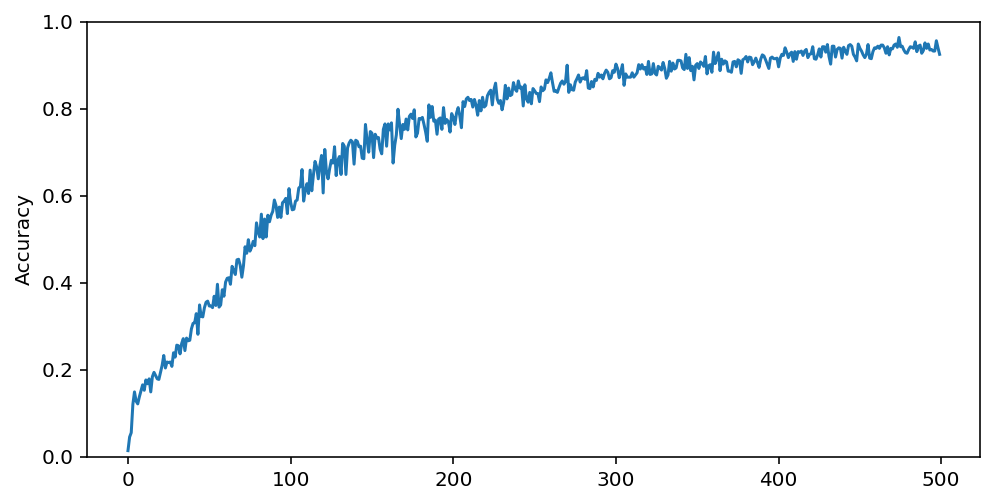

<Figure size 432x288 with 0 Axes>

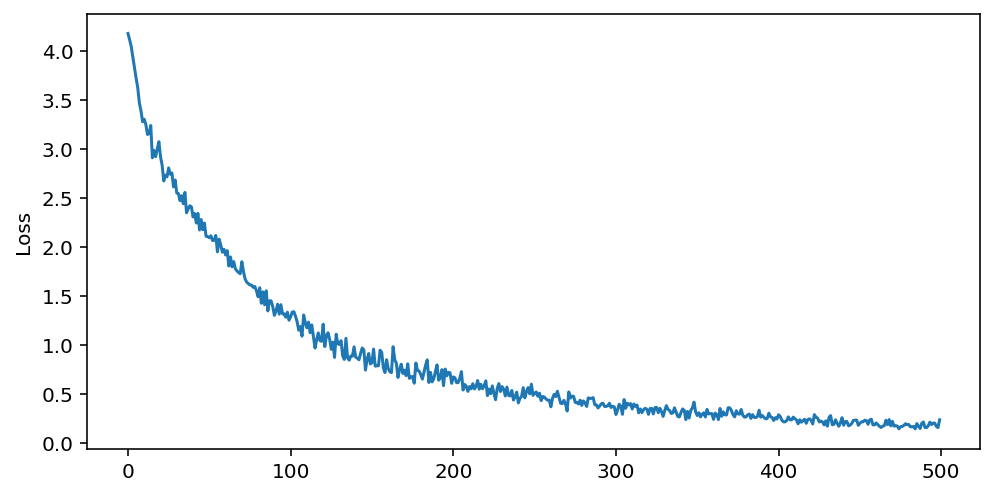

In [24]:
plot_history(history)

# 5 - Predictions for generating new music

Now the fun part begins: we can use our trained model for generating music.
We have to feed the model some sort of seed to get it started, i.e., a note for timestep 0. We can tune the model to iteratively predict each consecutive character to create a novel sequence. Using our `idx2str` mapping, we can convert the predicted indices into note strings. Finally, we use Music21 for converting the representation into a MIDI file.

## Save and restore from latest checkpoint

To keep this step simple, we will use a batch size of 1. Because of how the LSTM state is passed from timestep to timestep, it is not possible to change the batch size once it is built (check the model summary). 

Hence, we have to save our model's weights, recreate the model with a new batch size, and restore the model's weights from saved checkpoint:

In [25]:
# Save checkpoint
ckpt_path = '/tmp/model_checkpoint'
model.save_weights(ckpt_path)

# Build new model
new_model = build_model(sequence_length, 
                        vocab_size, 
                        vocab_size, 
                        hidden_size, 
                        batch_size=1)

# Restore weights
new_model.load_weights(ckpt_path)

# We should see the first dimension of the input and output to be `1`
print(new_model.summary())

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(1, 50)]                 0         
_________________________________________________________________
embedding_1 (Embedding)      (1, 50, 64)               4096      
_________________________________________________________________
lstm_1 (LSTM)                (1, 50, 512)              1181696   
_________________________________________________________________
batch_normalization_1 (Batch (1, 50, 512)              2048      
_________________________________________________________________
dropout_2 (Dropout)          (1, 50, 512)              0         
_________________________________________________________________
dense_2 (Dense)              (1, 50, 256)              131328    
_________________________________________________________________
dropout_3 (Dropout)          (1, 50, 256)              0   

## Prediction Procedure
Here's the summary of the procedure:
- Initialize a seed start string and LSTM state and set the number of strings we want to generate.
- Use the start string and LSTM state to predict the next string.
- Use predicted string as input to the model in the next timestep.
- At each timestep, the updated LSTM state is fed back into the model.

In [0]:
from tqdm import tqdm

def generate_notes(model, seed_str, str2idx, generation_length=100):
  
  # Convert to numeric representation
  input_x = [str2idx[seed_str]]
  input_x = tf.expand_dims(input_x, 0)

  # Init generated sequence with seed
  generated_sequence = [seed_str]

  # Start with fresh state at begin of sequence
  model.reset_states()
  for i in tqdm(range(generation_length)):
    
    # Evaluate input to get prediction
    predictions = model(input_x)

    # Remove batch dimension
    predictions = tf.squeeze(predictions, 0)

    # Sample predicted string
    predicted_idx = tf.squeeze(np.argmax(predictions, axis=1)).numpy()

    # Pass the prediction along with the previous hidden state as next inputs
    input_x = tf.expand_dims([predicted_idx], 0)

    # Add predicted string to the generated sequence
    generated_sequence.append( idx2str[predicted_idx] )

  return generated_sequence

In [27]:
print(list(str2idx.keys()))

['0', '0.2.6', '0.4', '0.4.7', '0.5', '0.6', '1.4', '10.0.4', '10.2', '11.0', '11.2', '11.2.5', '11.2.5.7', '11.4', '2', '2.5', '2.6', '2.7', '4.7', '4.7.10', '4.9', '5.7', '5.7.11', '5.9', '5.9.0', '6.9', '7.0', '7.10', '7.10.2', '7.11', '7.11.2', '7.9', '7.9.0', '9', '9.0', '9.11', '9.2', 'A2', 'A3', 'A4', 'B-3', 'B-4', 'B3', 'B4', 'C#4', 'C#5', 'C3', 'C4', 'C5', 'D3', 'D4', 'D5', 'E-4', 'E-5', 'E3', 'E4', 'F#3', 'F#4', 'F2', 'F3', 'F4', 'G2', 'G3', 'G4']


Select a seed string to start with, e.g., 'C4' and generate a new sequence!

In [28]:
generated_sequence = generate_notes(new_model, 'A4', str2idx, 100)
print('\n',generated_sequence[:10])

  0%|          | 0/100 [00:00<?, ?it/s]

  7%|▋         | 7/100 [00:00<00:01, 64.68it/s]

 15%|█▌        | 15/100 [00:00<00:01, 67.43it/s]

 22%|██▏       | 22/100 [00:00<00:01, 68.12it/s]

 30%|███       | 30/100 [00:00<00:01, 69.51it/s]

 38%|███▊      | 38/100 [00:00<00:00, 70.18it/s]

 46%|████▌     | 46/100 [00:00<00:00, 72.14it/s]

 54%|█████▍    | 54/100 [00:00<00:00, 72.97it/s]

 61%|██████    | 61/100 [00:00<00:00, 71.83it/s]

 69%|██████▉   | 69/100 [00:00<00:00, 71.94it/s]

 77%|███████▋  | 77/100 [00:01<00:00, 73.23it/s]

 85%|████████▌ | 85/100 [00:01<00:00, 67.73it/s]

 92%|█████████▏| 92/100 [00:01<00:00, 64.54it/s]

 99%|█████████▉| 99/100 [00:01<00:00, 65.09it/s]

100%|██████████| 100/100 [00:01<00:00, 68.84it/s]


 ['A4', 'A4', 'A4', 'A4', 'A4', 'A4', 'C5', 'F4', 'G4', 'A4']


## Play the generated music

The cell below creates methods for converting MIDIs to Wave audio files (required for beeing played in Colab) and adds a small player. Run the cell and play back your generated music!

In [29]:
#@title Install dependencies, define `midi_player()` & `create_midi()`

!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
!pip install midi2audio
from midi2audio import FluidSynth
from IPython.display import Audio

def midi_player(filepath, overwrite=True):
  wav_file = filepath.replace('.mid', '.wav')
  if not os.path.isfile(wav_file) or overwrite:
    print('Converting {} --> {}'.format(filepath, wav_file))
    FluidSynth("font.sf2").midi_to_audio(filepath, wav_file)
    print('Initializing player')
  else:
    print('File already exists')
  return Audio(wav_file)

def create_midi(sequence, target_file='output.mid'):
  '''convert the output from the prediction to notes and create a midi file from the notes'''
  offset = 0
  output_notes = []

  # create note and chord objects based on the values generated by the model
  for string in sequence:

    if ('.' in string) or string.isdigit(): # string is a chord
      notes_in_chord = string.split('.')
      notes = []
      for current_note in notes_in_chord:
        new_note = note.Note(int(current_note))
        new_note.storedInstrument = instrument.Piano()
        notes.append(new_note)
      new_chord = chord.Chord(notes)
      new_chord.offset = offset
      output_notes.append(new_chord)
    
    else: # string is a note
      new_note = note.Note(string)
      new_note.offset = offset
      new_note.storedInstrument = instrument.Piano()
      output_notes.append(new_note)

    # increase offset each iteration so that notes do not stack
    offset += 0.5

  midi_stream = stream.Stream(output_notes)
  midi_stream.write('midi', fp=target_file)
  print('Sequence written to file: "{}"'.format(target_file))

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 7 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archive.ubu

In [30]:
# Convert sequence to midi
create_midi(generated_sequence, 'crazy_christmas_medley.mid')

# Play midi
midi_player('crazy_christmas_medley.mid')

Sequence written to file: "crazy_christmas_medley.mid"
Converting crazy_christmas_medley.mid --> crazy_christmas_medley.wav
Initializing player


In [31]:
# Compare to one of the training files
midi_player(filepaths[-2])

Converting /tmp/midi/JoytotheWorld.mid --> /tmp/midi/JoytotheWorld.wav
Initializing player


---
Congratulations on building your first sequence model! We suggest you to go further and investigate how the `sequence_length`, `batch_size`, `num_epochs`, `learning_rate`, as well as the architecture of the model affect the result. Also, does the `seed_str` affect the result? At last, you might add more training examples or even use your own dataset if you like.

In the meantime, have fun and happy listening! 

We wish you a Merry Christmas and a Happy New Year! See you in 2020!